In [1]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import numpy as np
import cv2
from PIL import Image
from glob import glob
import skimage.io as io
import shutil

import torch
from torch import nn
from torch.optim import Adam
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torchvision as tv
import torch.nn.functional as F
from torch import Tensor
plt.close()

In [2]:
current_path = os.getcwd()
converted_path = current_path.replace('/', '\\')
print(converted_path)

\home\duong\git\DecodeItAll\bio_seman_seg\unet\sessile-main-Kvasir-SEG


In [3]:
bio_seg_dir = "/".join(converted_path.split("\\")[:-2])
print(bio_seg_dir)
print(os.path.exists(bio_seg_dir))

/home/duong/git/DecodeItAll/bio_seman_seg
True


In [4]:
data_dir = bio_seg_dir + "/dataset/sessile-main-Kvasir-SEG"
print(os.listdir(data_dir))

['masks', 'images']


In [5]:
img_dir = data_dir + "/images"
msk_dir = data_dir + "/masks"

print(f"No. Img: {len(os.listdir(img_dir))}")
print(f"No. Msk: {len(os.listdir(msk_dir))}")

No. Img: 196
No. Msk: 196


In [6]:
class PolypDataset(Dataset):
    def __init__(self, transform = None, target_transform = None):
        from glob import glob
        self.imgs = sorted(glob(img_dir + "/*"))
        self.msks = sorted(glob(msk_dir + "/*"))
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_path = self.imgs[idx]
        msk_path = self.msks[idx]

        img = Image.open(img_path)
        msk = Image.open(msk_path)

        if self.transform:
            img = self.transform(img)

        if self.target_transform:
            msk = self.target_transform(msk)

        return (img, msk)

In [7]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5757, 0.3280, 0.2384), (0.3077, 0.2093, 0.1699))
])

target_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

ds = PolypDataset(transform=transform, target_transform=target_transform)
train_ds, test_ds = random_split(ds, [0.8, 0.2])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


157


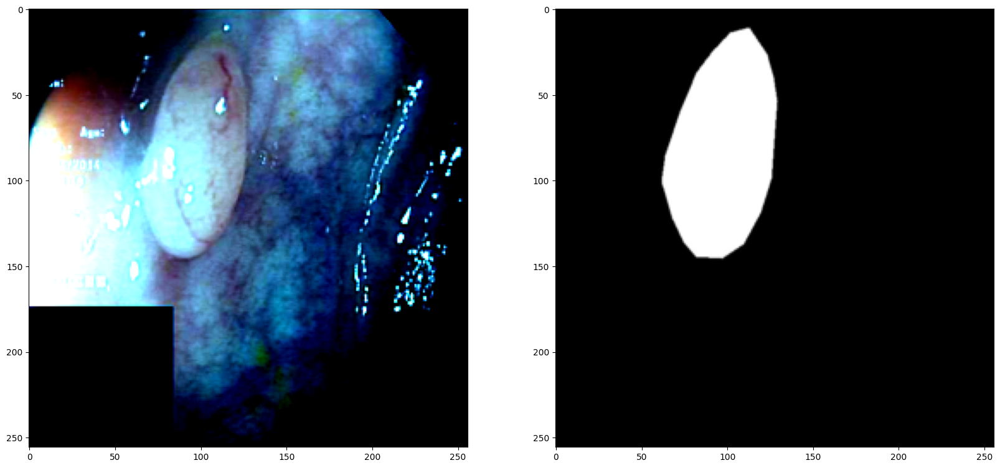

In [9]:
print(len(train_ds))

img, msk = train_ds[25]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))

ax1.imshow(img.permute(1, -1, 0).numpy())
ax2.imshow(msk.permute(1, -1, 0).numpy(), cmap = 'gray')

In [10]:
train_dl = DataLoader(train_ds, batch_size=20, shuffle=True)

print(len(train_dl))

8


In [11]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

In [12]:
class Down(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

In [13]:
class Up(nn.Module):    

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

In [14]:
class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

In [15]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = (DoubleConv(n_channels, 16))
        self.down1 = (Down(16, 32)) #64, 128
        self.down2 = (Down(32, 64)) #128, 256
        self.down3 = (Down(64, 128)) #256, 512
        factor = 2 if bilinear else 1
        self.down4 = (Down(128, 256 // factor)) #512, 1024
        self.up1 = (Up(256, 128 // factor, bilinear)) #1024, 512
        self.up2 = (Up(128, 64 // factor, bilinear)) #512, 256
        self.up3 = (Up(64, 32 // factor, bilinear)) #256, 128
        self.up4 = (Up(32, 16, bilinear)) #128, 64
        self.outc = (OutConv(16, n_classes)) #64

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu", index = 0)

model = UNet(3, 1, False).to(device)

optimizer = Adam(params = model.parameters(), lr = 0.001)

epochs = 100

loss_fn = nn.BCEWithLogitsLoss()

In [17]:
old_loss = 1e26
best_dct = None
last_dct = None
for epoch in range(epochs):
    model.train()
    tr_total_loss = 0
    tr_total_dice = 0
    tr_total_iou = 0
    for train_img, train_mask in tqdm(train_dl):
        train_img = train_img.to(device)
        train_mask = train_mask.to(device)

        train_gen_mask = model(train_img)        
        train_loss = loss_fn(train_gen_mask, train_mask)

        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()        
        
        tr_total_loss += train_loss.cpu().item()        
            
    mean_train_loss = tr_total_loss/len(train_dl)

    if mean_train_loss <= old_loss:
        old_loss = mean_train_loss
        best_dct = model.state_dict()
    
    last_dct = model.state_dict()

    print(f"Epoch: {epoch} - TrainLoss: {mean_train_loss}")
model.load_state_dict(best_dct)

100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:02<00:00,  3.34it/s]


Epoch: 0 - TrainLoss: 0.695185974240303


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.57it/s]


Epoch: 1 - TrainLoss: 0.6291891932487488


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 2 - TrainLoss: 0.5867253765463829


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.84it/s]


Epoch: 3 - TrainLoss: 0.5618729814887047


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.77it/s]


Epoch: 4 - TrainLoss: 0.5327626690268517


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 5 - TrainLoss: 0.507439061999321


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.77it/s]


Epoch: 6 - TrainLoss: 0.48355280607938766


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 7 - TrainLoss: 0.46766431257128716


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 8 - TrainLoss: 0.4488748088479042


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 9 - TrainLoss: 0.42956139147281647


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 10 - TrainLoss: 0.411912951618433


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 11 - TrainLoss: 0.39659860730171204


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 12 - TrainLoss: 0.38282303139567375


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.68it/s]


Epoch: 13 - TrainLoss: 0.36908966675400734


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 14 - TrainLoss: 0.3562740348279476


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 15 - TrainLoss: 0.3437807932496071


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.71it/s]


Epoch: 16 - TrainLoss: 0.3343079686164856


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 17 - TrainLoss: 0.3241943307220936


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 18 - TrainLoss: 0.316120695322752


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 19 - TrainLoss: 0.30804505199193954


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 20 - TrainLoss: 0.29976465180516243


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 21 - TrainLoss: 0.2904067151248455


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 22 - TrainLoss: 0.2847845293581486


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 23 - TrainLoss: 0.27670634910464287


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 24 - TrainLoss: 0.27105999179184437


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 25 - TrainLoss: 0.2636303324252367


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 26 - TrainLoss: 0.2626718245446682


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 27 - TrainLoss: 0.25901341810822487


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 28 - TrainLoss: 0.25137415900826454


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 29 - TrainLoss: 0.24682855233550072


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 30 - TrainLoss: 0.24301367439329624


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 31 - TrainLoss: 0.23633549362421036


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 32 - TrainLoss: 0.230425413697958


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 33 - TrainLoss: 0.22577668353915215


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 34 - TrainLoss: 0.22609440237283707


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 35 - TrainLoss: 0.21877523325383663


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 36 - TrainLoss: 0.21488560736179352


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 37 - TrainLoss: 0.21142707765102386


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 38 - TrainLoss: 0.21279930509626865


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 39 - TrainLoss: 0.20664129592478275


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.77it/s]


Epoch: 40 - TrainLoss: 0.20452553033828735


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 41 - TrainLoss: 0.19849472306668758


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 42 - TrainLoss: 0.19628814980387688


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 43 - TrainLoss: 0.19933070428669453


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 44 - TrainLoss: 0.19447615183889866


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 45 - TrainLoss: 0.1914055310189724


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.77it/s]


Epoch: 46 - TrainLoss: 0.1938970386981964


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 47 - TrainLoss: 0.18589272163808346


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 48 - TrainLoss: 0.18278618529438972


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 49 - TrainLoss: 0.18294827081263065


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 50 - TrainLoss: 0.17490507289767265


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.69it/s]


Epoch: 51 - TrainLoss: 0.1804818045347929


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 52 - TrainLoss: 0.17272714897990227


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.71it/s]


Epoch: 53 - TrainLoss: 0.16716181673109531


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 54 - TrainLoss: 0.16599864326417446


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.68it/s]


Epoch: 55 - TrainLoss: 0.1667110901325941


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.77it/s]


Epoch: 56 - TrainLoss: 0.16271502058953047


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 57 - TrainLoss: 0.15881935693323612


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 58 - TrainLoss: 0.14806148316711187


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.84it/s]


Epoch: 59 - TrainLoss: 0.14941146411001682


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.66it/s]


Epoch: 60 - TrainLoss: 0.14777230191975832


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 61 - TrainLoss: 0.13433283101767302


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 62 - TrainLoss: 0.13229213934391737


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.69it/s]


Epoch: 63 - TrainLoss: 0.12854619789868593


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 64 - TrainLoss: 0.13071958348155022


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.85it/s]


Epoch: 65 - TrainLoss: 0.11832689587026834


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 66 - TrainLoss: 0.116126942448318


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.69it/s]


Epoch: 67 - TrainLoss: 0.11679004970937967


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 68 - TrainLoss: 0.11218636948615313


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 69 - TrainLoss: 0.10940198134630919


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.72it/s]


Epoch: 70 - TrainLoss: 0.10744973924010992


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 71 - TrainLoss: 0.10108359064906836


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 72 - TrainLoss: 0.10259845666587353


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 73 - TrainLoss: 0.09967679623514414


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.83it/s]


Epoch: 74 - TrainLoss: 0.09461534395813942


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.77it/s]


Epoch: 75 - TrainLoss: 0.09194654040038586


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 76 - TrainLoss: 0.08867292944341898


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.68it/s]


Epoch: 77 - TrainLoss: 0.08729432988911867


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 78 - TrainLoss: 0.08688965253531933


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 79 - TrainLoss: 0.07605621544644237


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 80 - TrainLoss: 0.07581816520541906


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.70it/s]


Epoch: 81 - TrainLoss: 0.07069226494058967


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.72it/s]


Epoch: 82 - TrainLoss: 0.06793638272210956


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 83 - TrainLoss: 0.06936054490506649


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.66it/s]


Epoch: 84 - TrainLoss: 0.06584527157247066


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 85 - TrainLoss: 0.06689920462667942


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.71it/s]


Epoch: 86 - TrainLoss: 0.06683876272290945


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 87 - TrainLoss: 0.0684540499933064


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 88 - TrainLoss: 0.06385981012135744


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 89 - TrainLoss: 0.05948940524831414


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.66it/s]


Epoch: 90 - TrainLoss: 0.05224705161526799


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.68it/s]


Epoch: 91 - TrainLoss: 0.04979044059291482


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 92 - TrainLoss: 0.045932184904813766


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.71it/s]


Epoch: 93 - TrainLoss: 0.047996181063354015


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 94 - TrainLoss: 0.04526035860180855


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 95 - TrainLoss: 0.04571891715750098


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.72it/s]


Epoch: 96 - TrainLoss: 0.04837805964052677


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 97 - TrainLoss: 0.05336925480514765


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.67it/s]


Epoch: 98 - TrainLoss: 0.044468240812420845


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.71it/s]

Epoch: 99 - TrainLoss: 0.042466610204428434


<All keys matched successfully>

In [18]:
test_dl = DataLoader(test_ds, batch_size=1, shuffle=True)
print(len(test_dl))

39


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


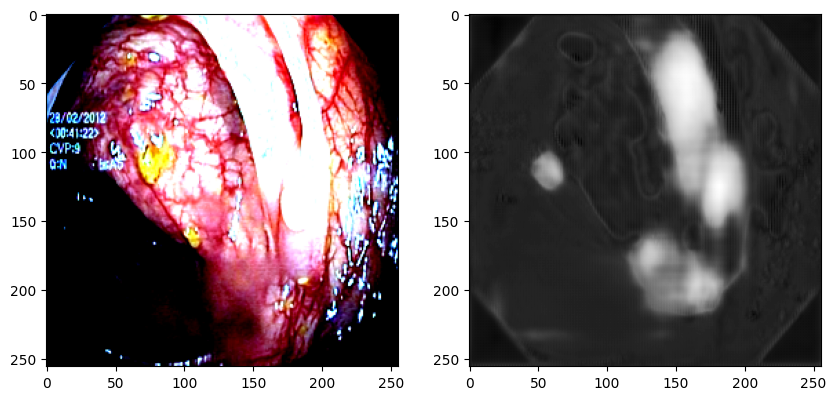

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


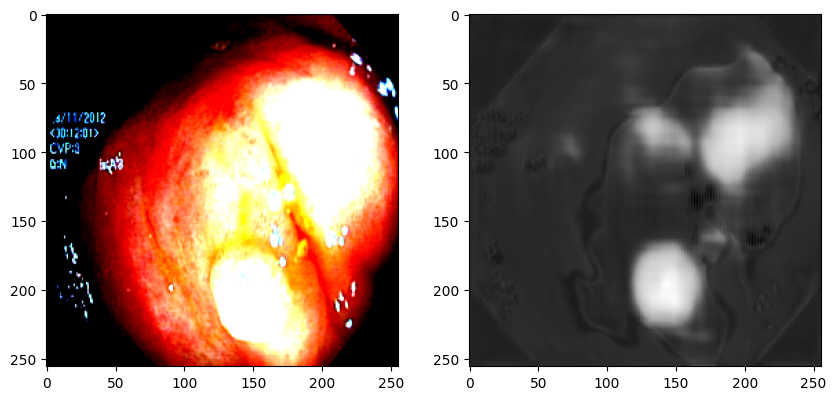

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


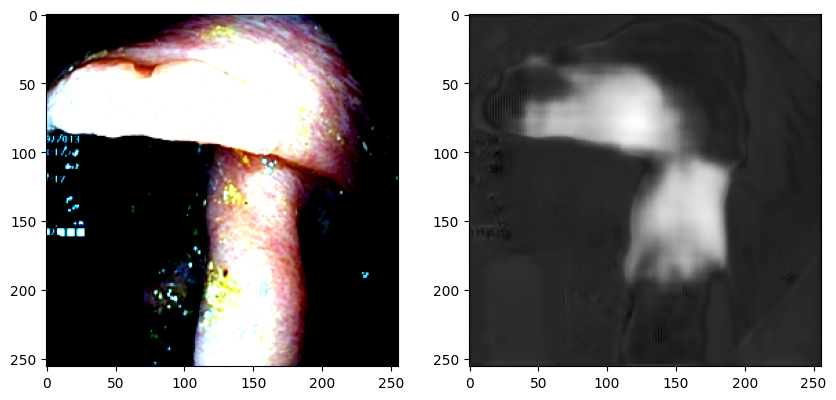

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


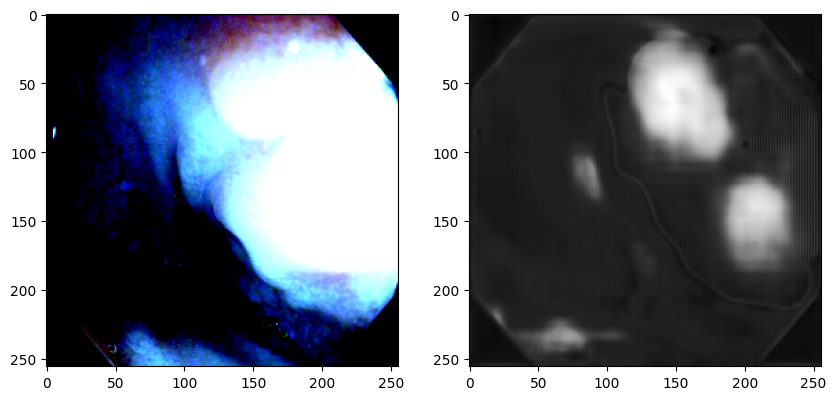

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


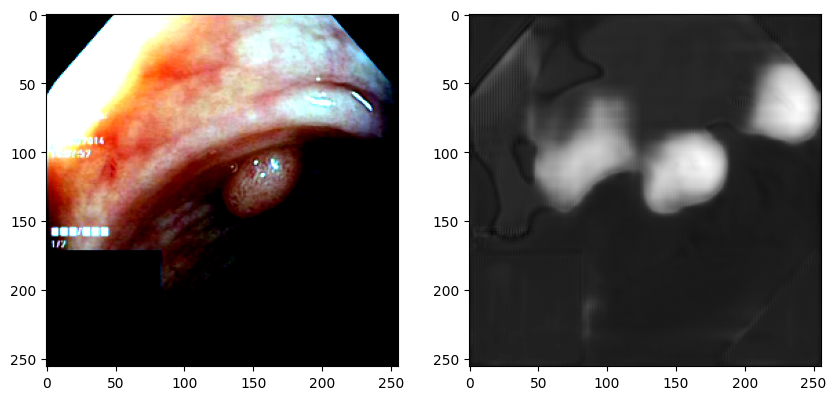

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


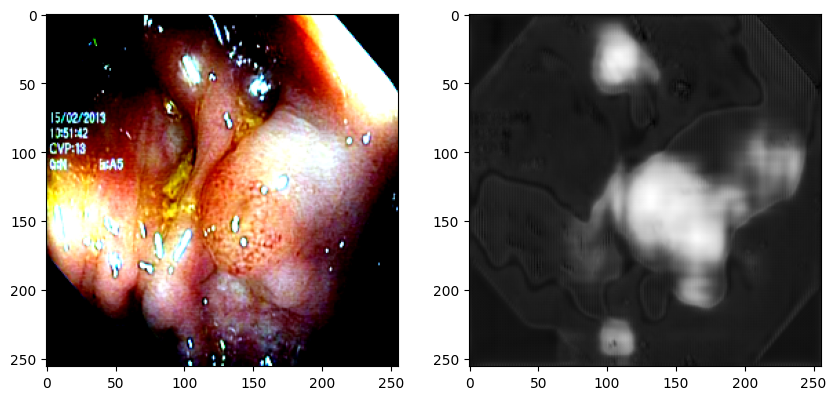

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


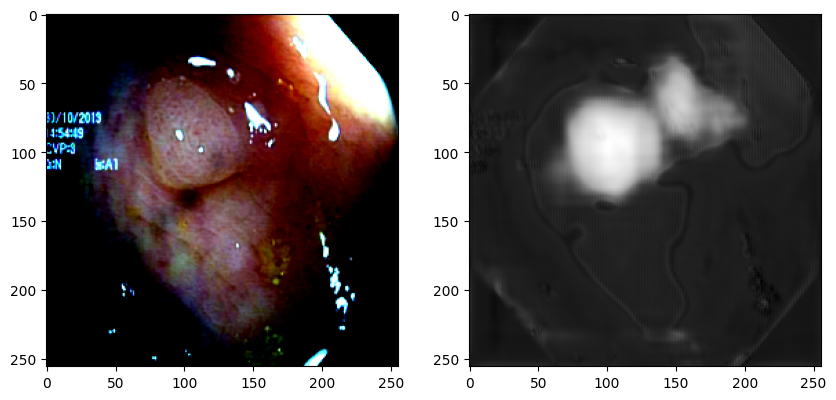

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


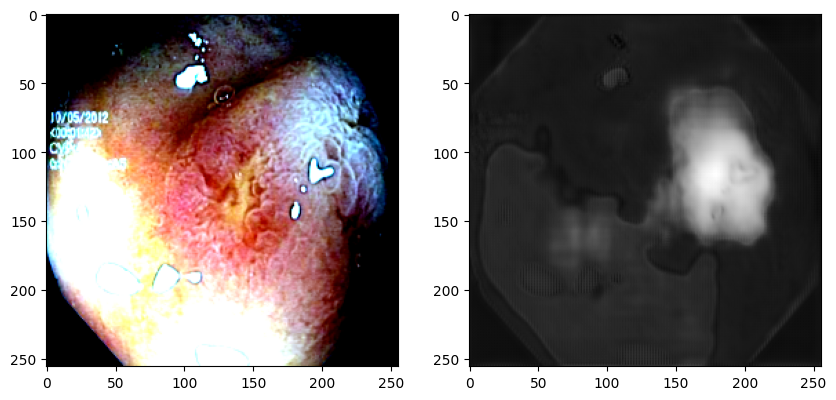

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


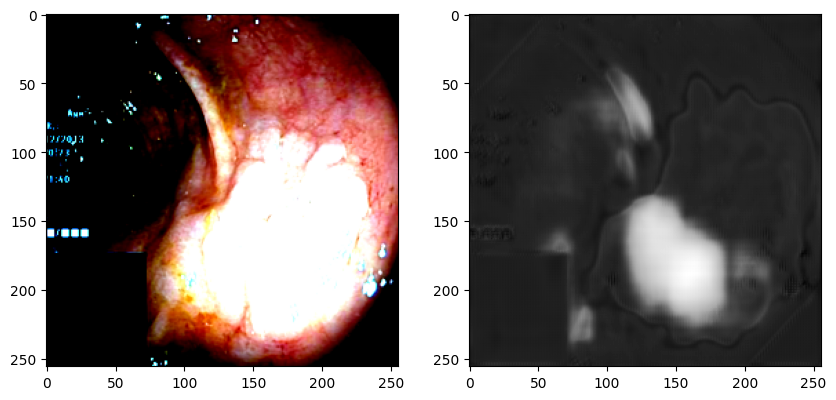

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


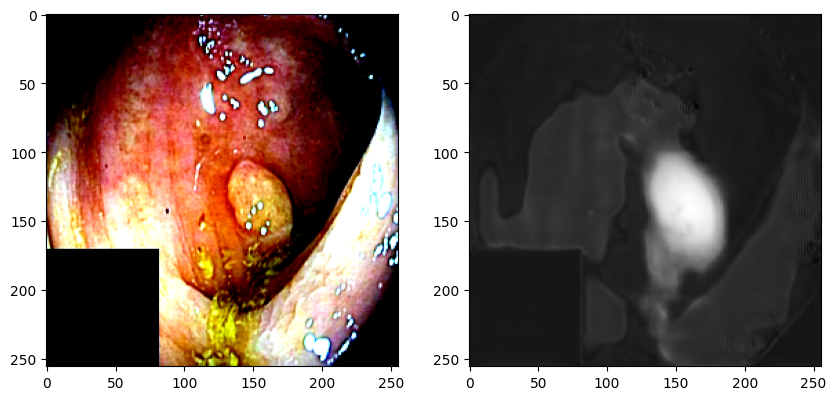

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


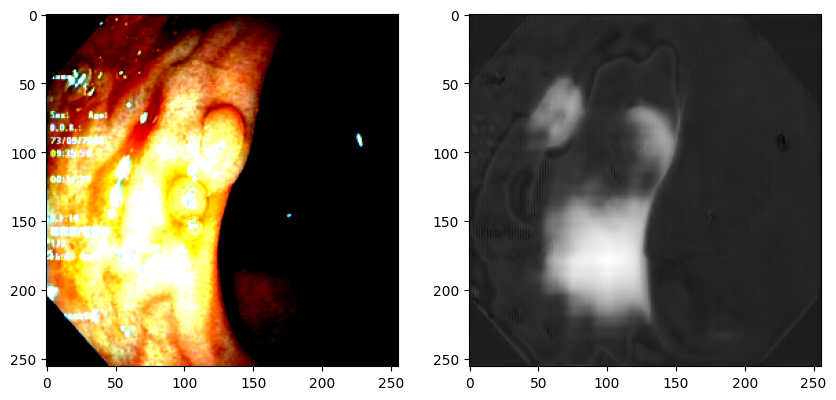

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


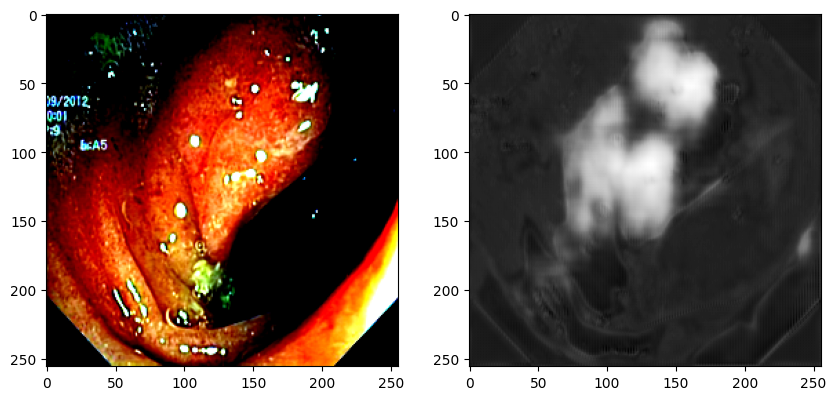

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


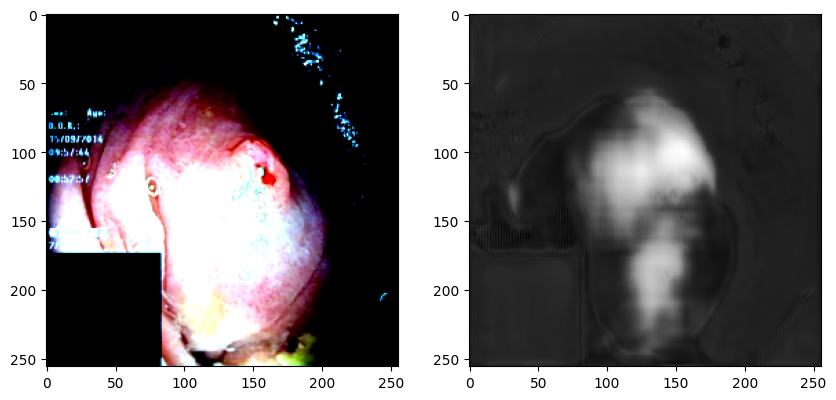

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


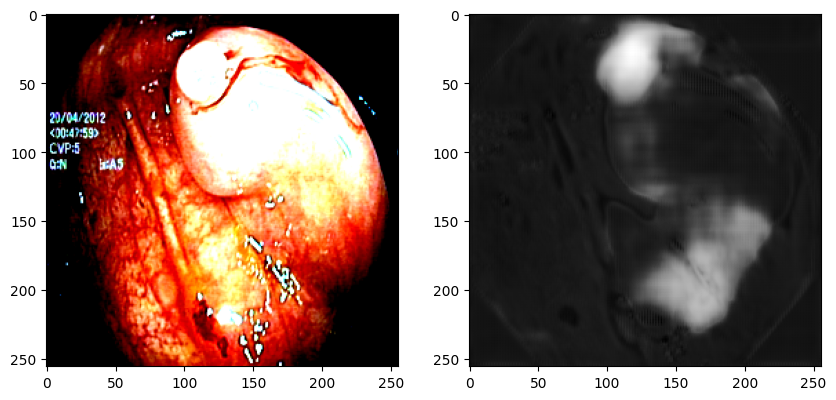

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


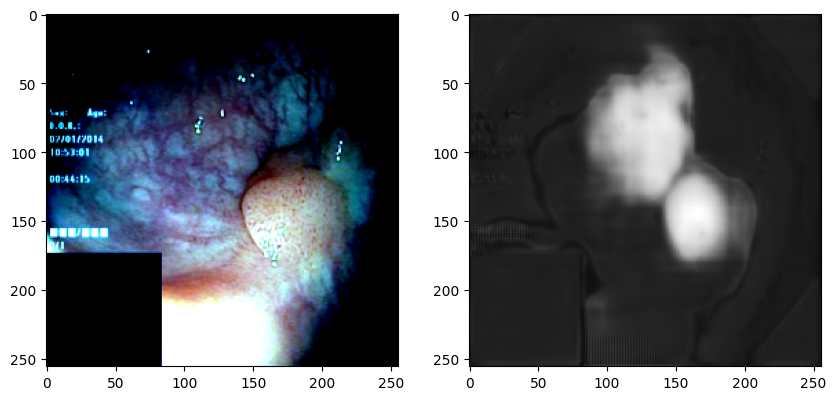

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


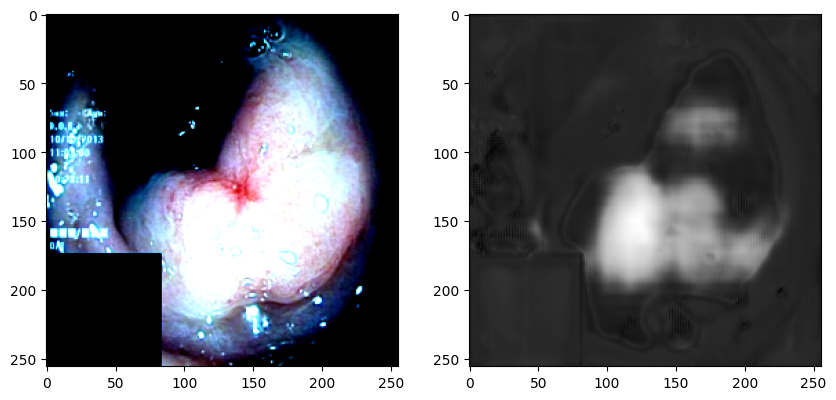

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


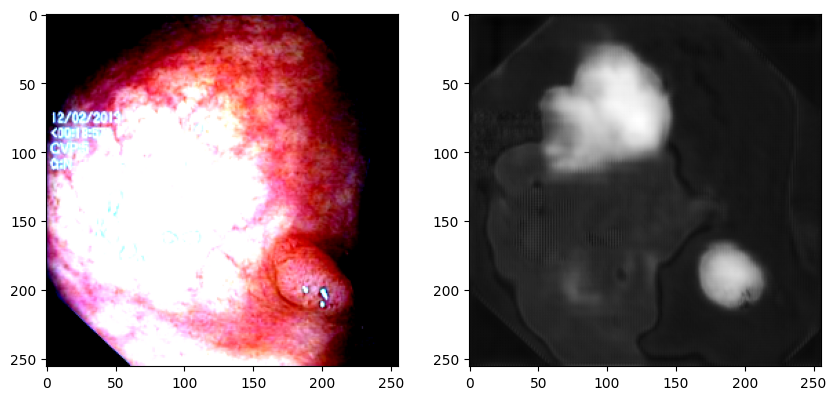

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


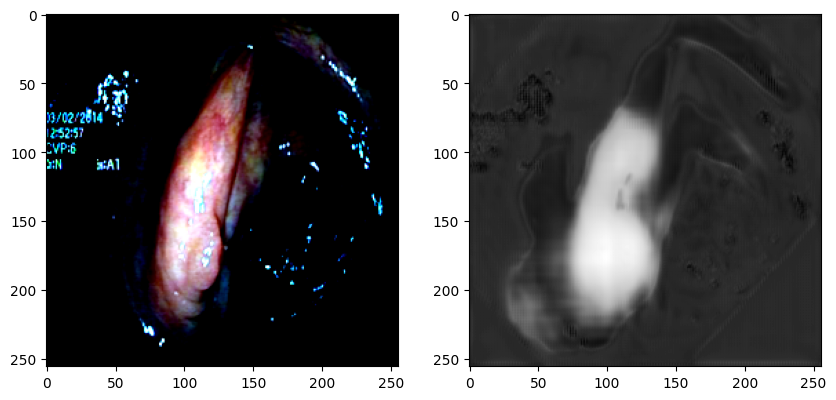

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


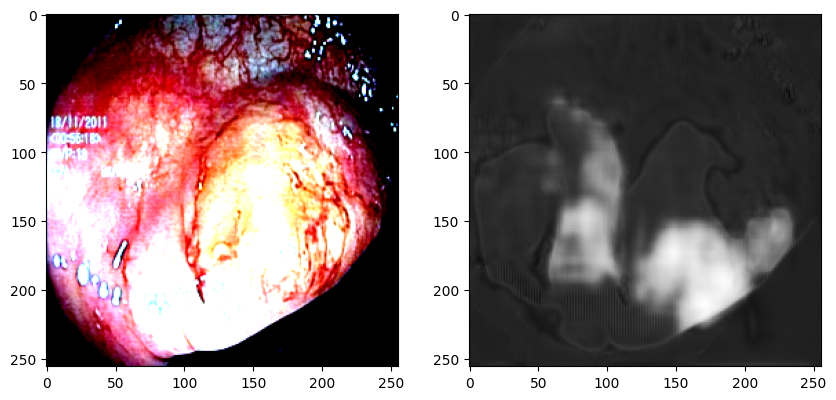

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


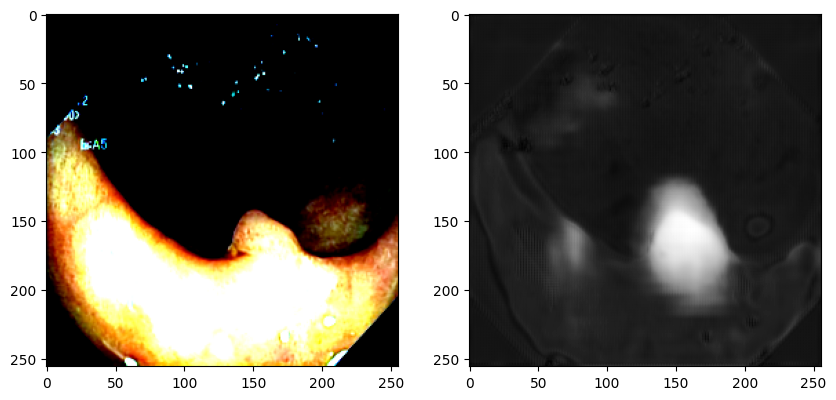

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


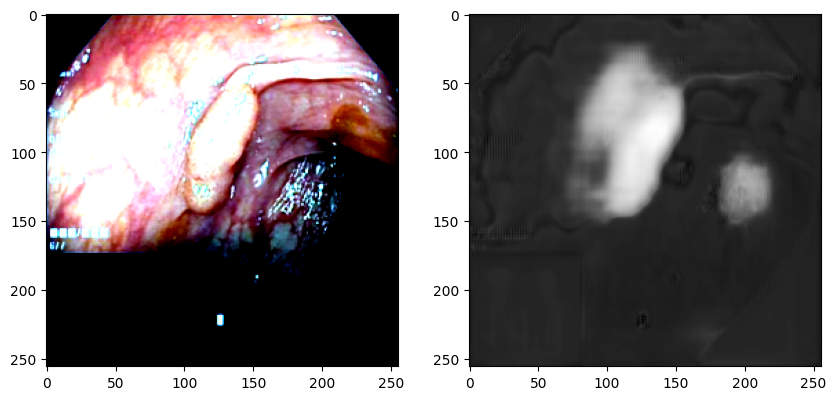

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


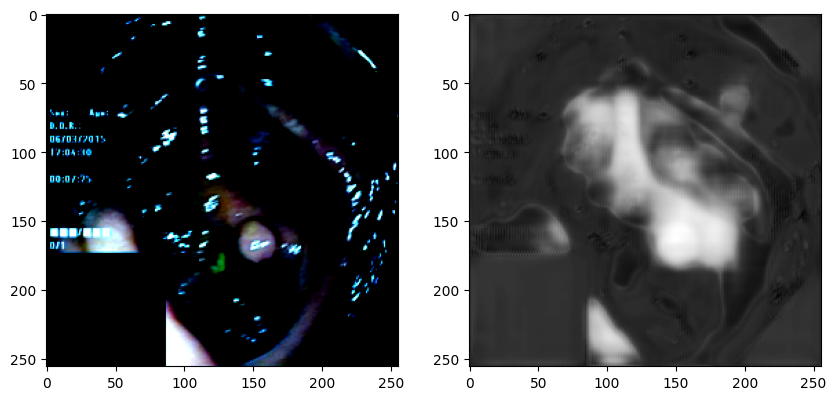

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


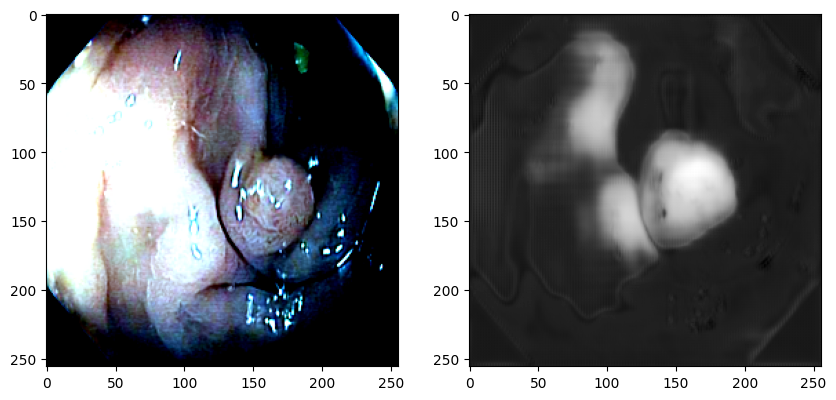

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


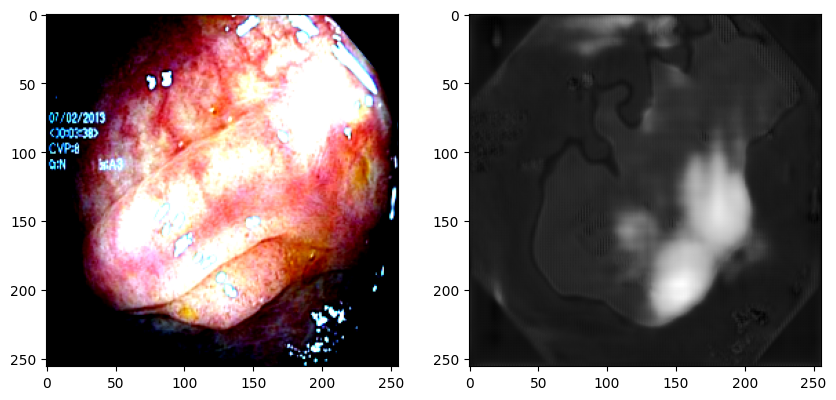

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


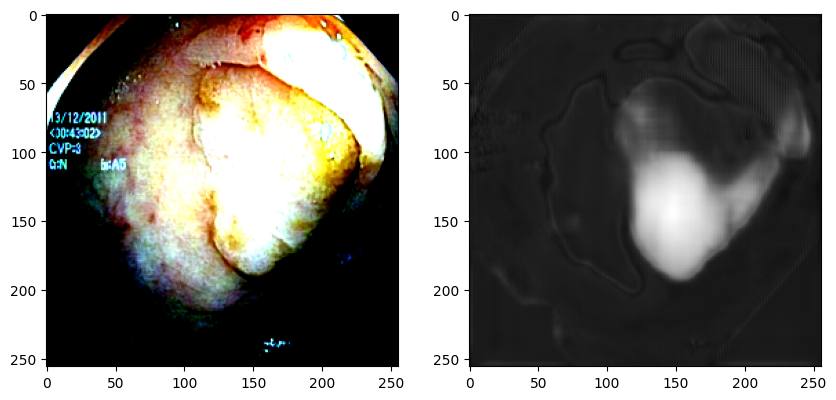

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


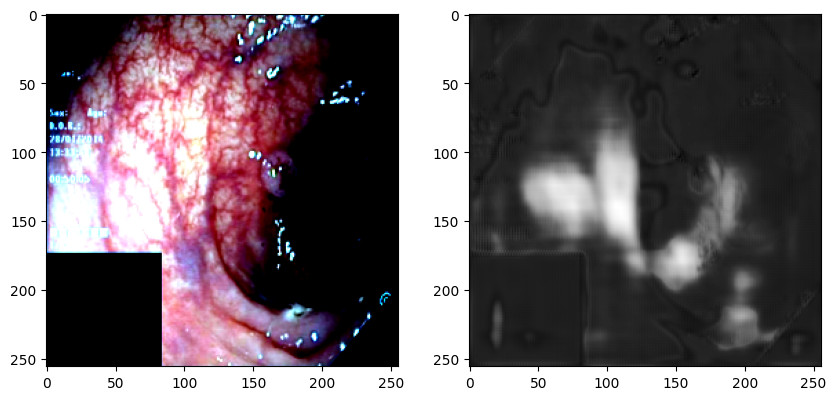

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


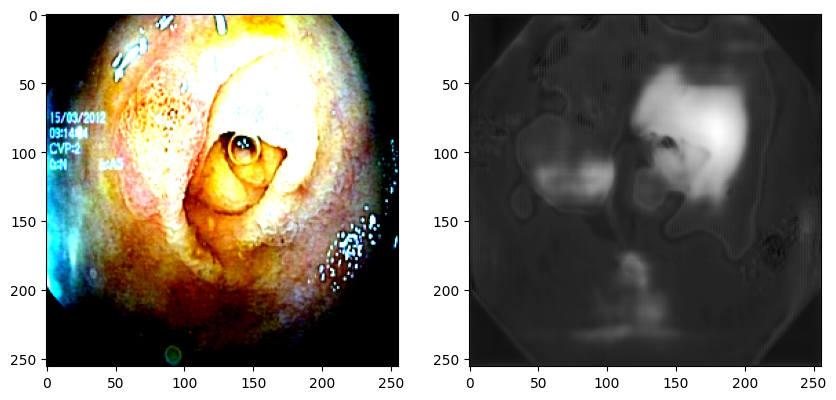

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


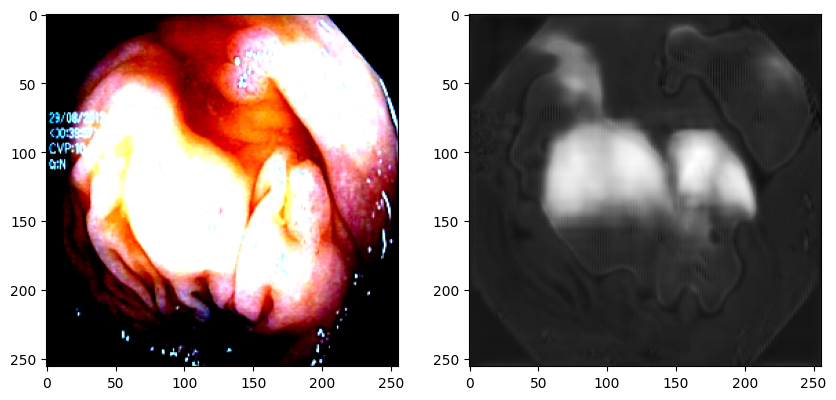

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


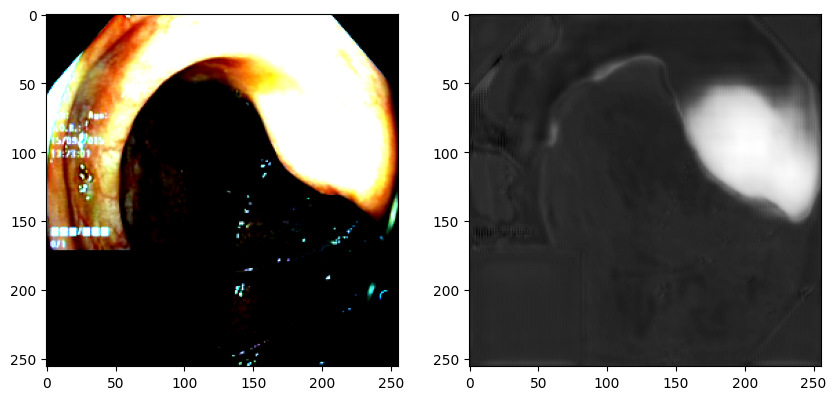

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


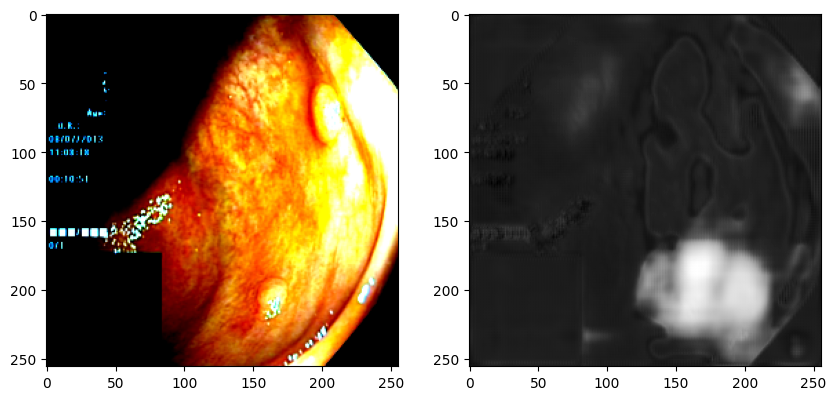

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


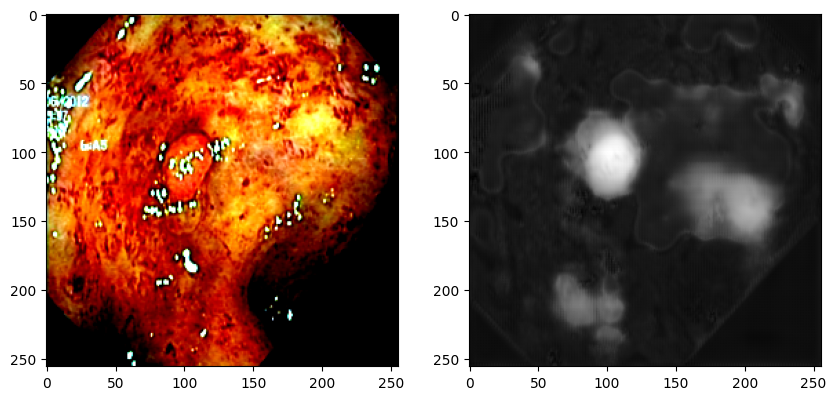

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


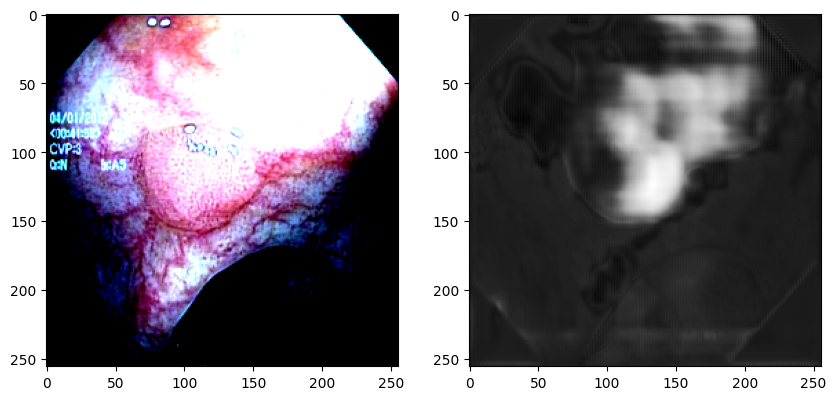

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


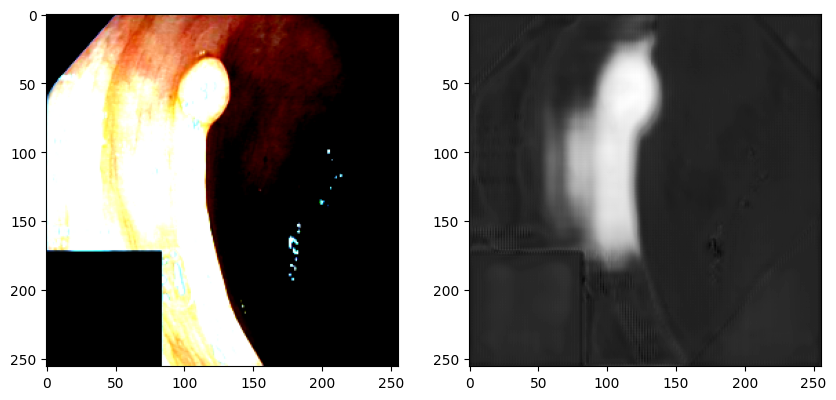

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


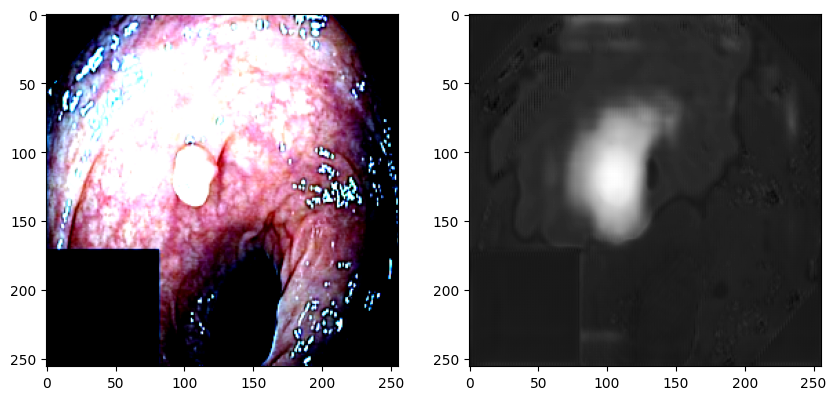

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


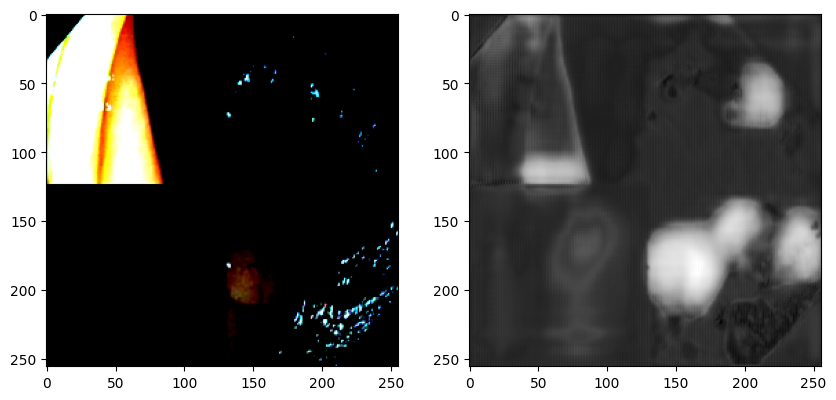

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


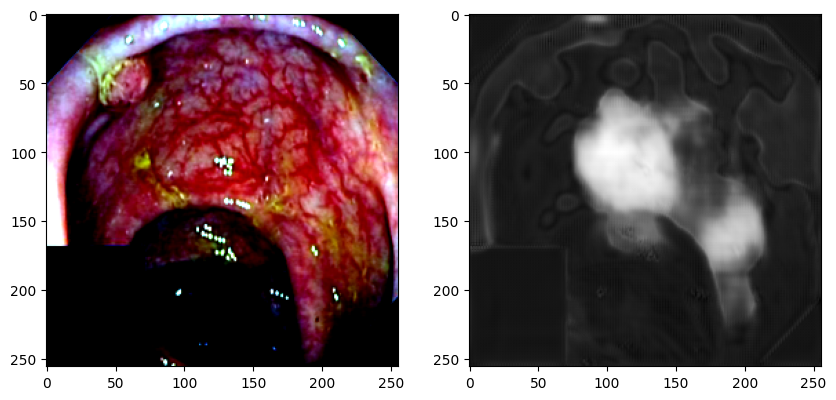

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


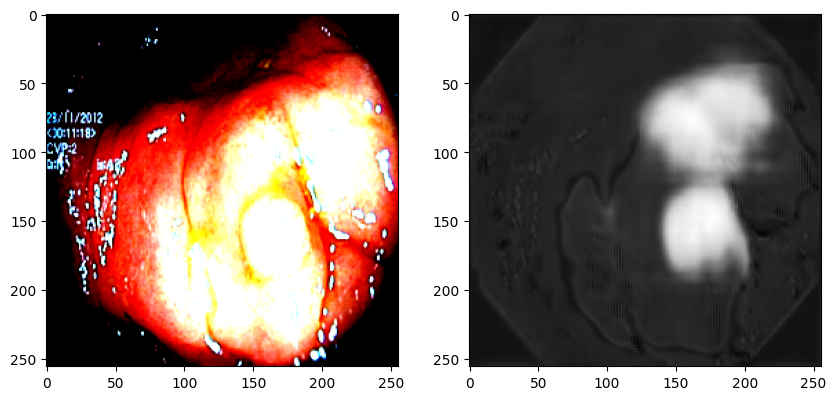

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


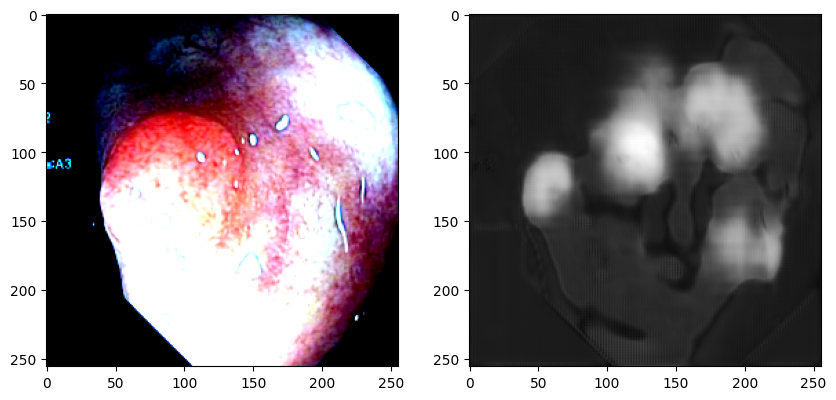

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


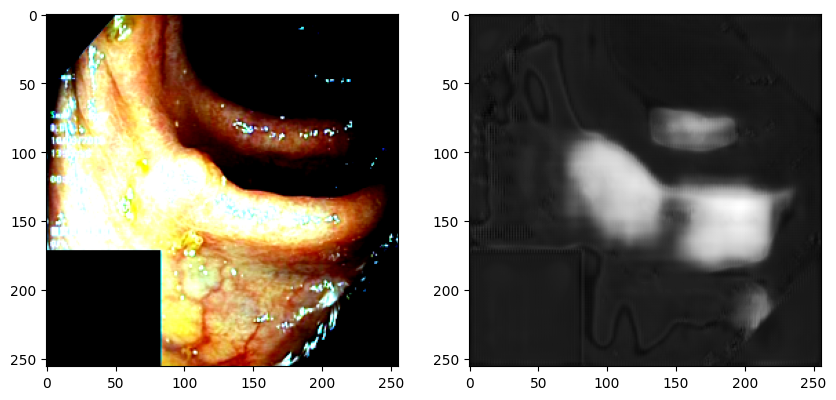

In [27]:
from glob import glob
for img, _ in test_dl:
    img = img.to(device)

    mask = model(img)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))

    ax1.imshow(img[0].permute(1, -1, 0).detach().cpu().numpy())
    ax2.imshow(mask[0].permute(1, -1, 0).detach().cpu().numpy(), cmap = 'gray')

    plt.show()  
    plt.close("all")  